**Import Libraries**

In [1]:
import os  # For operating system interactions like file/directory handling
import cv2  # OpenCV library for image processing
import random  # For generating random numbers or shuffling data
import numpy as np  # For numerical operations on arrays and matrices
import pandas as pd  # For data manipulation and analysis
from tqdm import tqdm  # For displaying progress bars during iterations
import matplotlib.pyplot as plt  # For creating plots and visualizations
import seaborn as sns # For enhanced data visualization with additional styling and plot types
from collections import Counter  # Import Counter from the collections module to count occurrences of elements


**Download the Dataset**

In [2]:
import kagglehub
dataset = kagglehub.dataset_download('ashishsaxena2209/animal-image-datasetdog-cat-and-panda')
print('Images download done.')



Images download done.


**Identify the image category**

In [3]:
dataset_path = '/kaggle/input/animal-image-datasetdog-cat-and-panda/animals/animals'
categories = os.listdir(dataset_path)
print("Categories:", categories)

Categories: ['dogs', 'panda', 'cats']


**Identify Images category and path**

In [4]:
for dirpath, dirnames, filenames in os.walk(dataset):
    print(f"\n {dirpath}")
    for fname in filenames[:5]:
        print("   └──", fname)



 /kaggle/input/animal-image-datasetdog-cat-and-panda

 /kaggle/input/animal-image-datasetdog-cat-and-panda/animals

 /kaggle/input/animal-image-datasetdog-cat-and-panda/animals/animals

 /kaggle/input/animal-image-datasetdog-cat-and-panda/animals/animals/dogs
   └── dogs_00583.jpg
   └── dogs_00683.jpg
   └── dogs_00750.jpg
   └── dogs_00652.jpg
   └── dogs_00895.jpg

 /kaggle/input/animal-image-datasetdog-cat-and-panda/animals/animals/panda
   └── panda_00716.jpg
   └── panda_00296.jpg
   └── panda_00830.jpg
   └── panda_00540.jpg
   └── panda_00089.jpg

 /kaggle/input/animal-image-datasetdog-cat-and-panda/animals/animals/cats
   └── cats_00850.jpg
   └── cats_00272.jpg
   └── cats_00101.jpg
   └── cats_00694.jpg
   └── cats_00725.jpg

 /kaggle/input/animal-image-datasetdog-cat-and-panda/animals/images
   └── cat.jpg
   └── dog.jpg
   └── panda.jpg

 /kaggle/input/animal-image-datasetdog-cat-and-panda/animals/dogs
   └── dogs_00583.jpg
   └── dogs_00683.jpg
   └── dogs_00750.jpg
   └

**Display randomly seleted 100 images**

Categories: ['dogs', 'panda', 'cats']


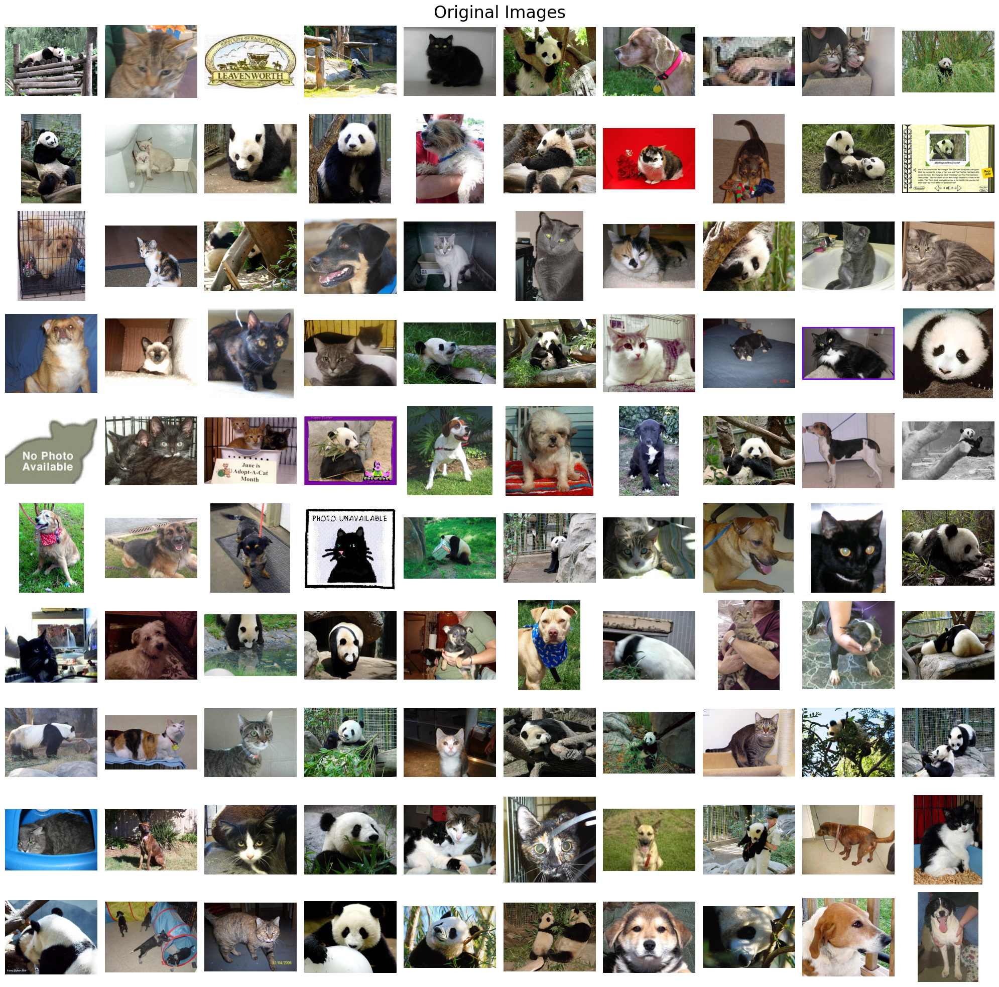

In [5]:

from tqdm import tqdm


dataset_path = '/kaggle/input/animal-image-datasetdog-cat-and-panda/animals/animals'


categories = os.listdir(dataset_path)
print("Categories:", categories)


image_paths = []
for category in categories:
    category_dir = os.path.join(dataset_path, category)
    for fname in os.listdir(category_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(category_dir, fname))

# Randomly select 100 images
random.shuffle(image_paths)
selected_images = image_paths[:100]


plt.figure(figsize=(20, 20))
for i, img_path in enumerate(selected_images):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib
    plt.subplot(10, 10, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.suptitle("Original Images", fontsize=24)
plt.tight_layout()
plt.show()




**Covert to grayscale images**

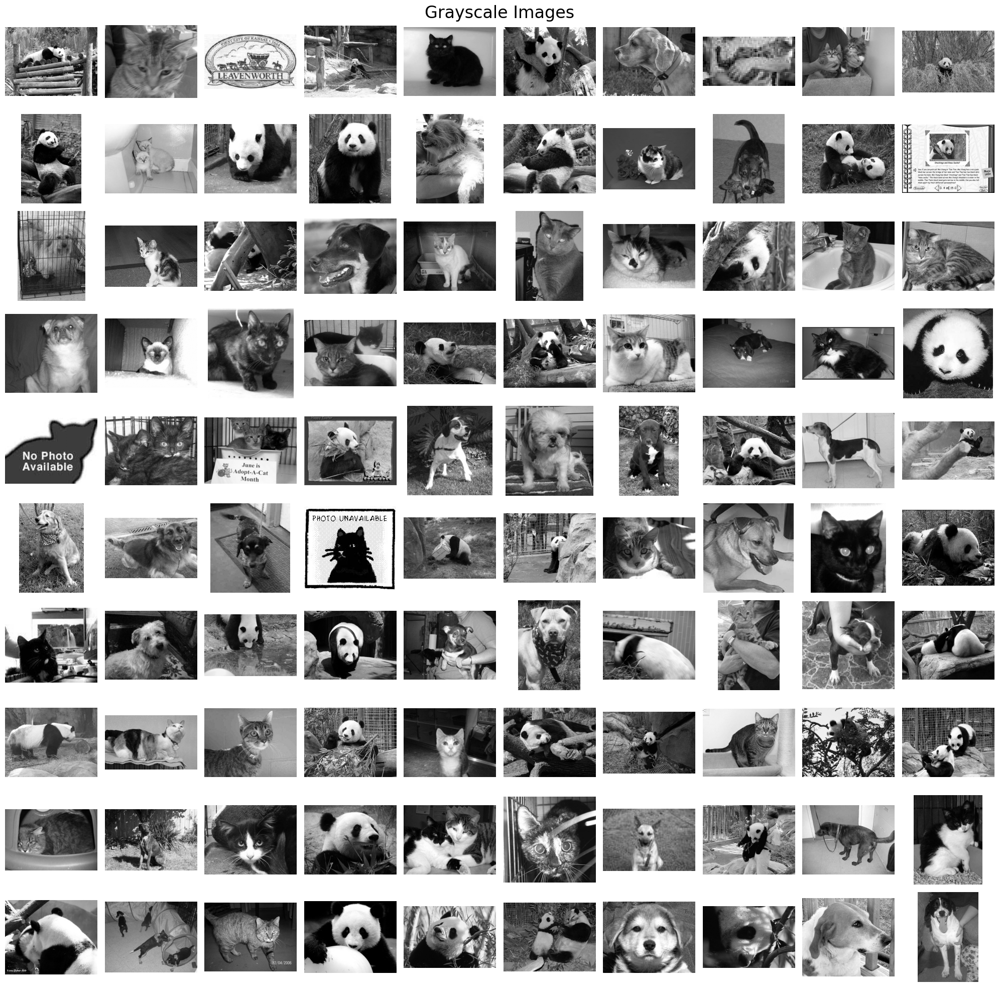

In [6]:
#Convert to grayscale and display
plt.figure(figsize=(20, 20))
for i, img_path in enumerate(selected_images):
    gray_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    plt.subplot(10, 10, i + 1)
    plt.imshow(gray_img, cmap='gray')
    plt.axis('off')
plt.suptitle("Grayscale Images", fontsize=24)
plt.tight_layout()
plt.show()

In [7]:
import os
import cv2
import numpy as np

categories = os.listdir('/kaggle/input/animal-image-datasetdog-cat-and-panda/animals/animals')
label_map = {cat: idx for idx, cat in enumerate(sorted(categories))}


data = []
labels = []

for img_path in selected_images:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (32, 32))  # Resize to 32x32
    data.append(img.flatten())       # Flatten to 1024-d vector


    label_name = os.path.basename(os.path.dirname(img_path))
    labels.append(label_map[label_name])

# Convert to NumPy arrays
data = np.array(data)
labels = np.array(labels)

print("Shape of data:", data.shape)
print("Shape of labels:", labels.shape)
print("Label map used:", label_map)


Shape of data: (100, 1024)
Shape of labels: (100,)
Label map used: {'cats': 0, 'dogs': 1, 'panda': 2}


**Implementation fo KNN and Calculation of Accuracy And Avgerage Accuracy For the Each fold**

In [14]:
def cross_validate_verbose(X, y, k=3, distance='l2', folds=5):
    fold_size = len(X) // folds
    indices = np.arange(len(X))
    np.random.shuffle(indices)

    accuracies = []

    print(f"K = {k}:")
    for fold in range(folds):
        start = fold * fold_size
        end = start + fold_size
        val_idx = indices[start:end]
        train_idx = np.concatenate((indices[:start], indices[end:]))

        X_train, y_train = X[train_idx], y[train_idx]
        X_val, y_val = X[val_idx], y[val_idx]

        correct = 0
        for i in range(len(X_val)):
            pred = knn_predict(X_train, y_train, X_val[i], k, distance)
            if pred == y_val[i]:
                correct += 1

        accuracy = correct / len(X_val)
        accuracies.append(accuracy)
        print(f"  Fold {fold + 1}: Accuracy = {accuracy:.2f}")

    avg_acc = np.mean(accuracies)
    print("  ----------------------------")
    print(f"  Average Accuracy = {avg_acc:.2f}")
    print("  ----------------------------\n")
    return avg_acc


for k in range(1, 31):
    cross_validate_verbose(data, labels, k=k, distance='l1', folds=5)


K = 1:
  Fold 1: Accuracy = 0.30
  Fold 2: Accuracy = 0.30
  Fold 3: Accuracy = 0.40
  Fold 4: Accuracy = 0.30
  Fold 5: Accuracy = 0.15
  ----------------------------
  Average Accuracy = 0.29
  ----------------------------

K = 2:
  Fold 1: Accuracy = 0.25
  Fold 2: Accuracy = 0.60
  Fold 3: Accuracy = 0.35
  Fold 4: Accuracy = 0.40
  Fold 5: Accuracy = 0.15
  ----------------------------
  Average Accuracy = 0.35
  ----------------------------

K = 3:
  Fold 1: Accuracy = 0.25
  Fold 2: Accuracy = 0.30
  Fold 3: Accuracy = 0.20
  Fold 4: Accuracy = 0.50
  Fold 5: Accuracy = 0.20
  ----------------------------
  Average Accuracy = 0.29
  ----------------------------

K = 4:
  Fold 1: Accuracy = 0.50
  Fold 2: Accuracy = 0.40
  Fold 3: Accuracy = 0.35
  Fold 4: Accuracy = 0.25
  Fold 5: Accuracy = 0.10
  ----------------------------
  Average Accuracy = 0.32
  ----------------------------

K = 5:
  Fold 1: Accuracy = 0.40
  Fold 2: Accuracy = 0.15
  Fold 3: Accuracy = 0.25
  Fold 4: A

**Visualize of the Results**

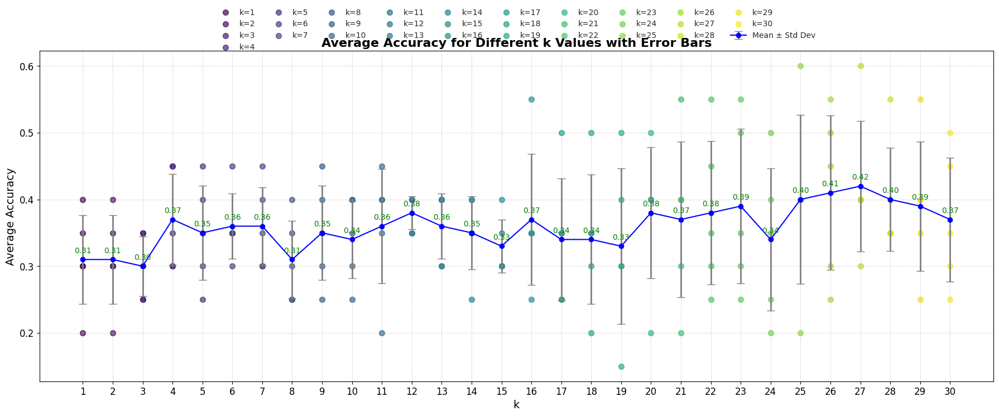

In [9]:
import numpy as np
import random
import os
import cv2
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns


def l1_distance(a, b):
    return np.sum(np.abs(a - b))  # Manhattan

def l2_distance(a, b):
    return np.sqrt(np.sum((a - b) ** 2))  # Euclidean

# k-NN prediction
def knn_predict(X_train, y_train, x_test, k=3, distance='l2'):
    distances = []
    for i in range(len(X_train)):
        dist = l1_distance(x_test, X_train[i]) if distance == 'l1' else l2_distance(x_test, X_train[i])
        distances.append((dist, y_train[i]))
    distances.sort(key=lambda x: x[0])
    k_nearest_labels = [label for _, label in distances[:k]]
    return Counter(k_nearest_labels).most_common(1)[0][0]

# Cross-validation function returning per-k fold accuracies
def cross_validate_k_range(X, y, k_values, distance='l2', folds=5):
    fold_size = len(X) // folds
    indices = np.arange(len(X))
    np.random.shuffle(indices)
    k_accuracies = {k: [] for k in k_values}

    for fold in range(folds):
        start = fold * fold_size
        end = start + fold_size
        val_idx = indices[start:end]
        train_idx = np.concatenate((indices[:start], indices[end:]))
        X_train, y_train = X[train_idx], y[train_idx]
        X_val, y_val = X[val_idx], y[val_idx]

        for k in k_values:
            correct = 0
            for i in range(len(X_val)):
                pred = knn_predict(X_train, y_train, X_val[i], k=k, distance=distance)
                if pred == y_val[i]:
                    correct += 1
            accuracy = correct / len(X_val)
            k_accuracies[k].append(accuracy)

    return k_accuracies

# Plotting function
def plot_accuracies(accuracies_dict, k_values):
    plt.figure(figsize=(18, 8))
    colors = plt.cm.viridis(np.linspace(0, 1, len(k_values)))
    mean_accuracies = []
    std_accuracies = []

    for (k, fold_accuracies), color in zip(accuracies_dict.items(), colors):
        plt.scatter([k] * len(fold_accuracies), fold_accuracies, color=color, alpha=0.7, s=50, label=f'k={k}')
        mean_acc = np.mean(fold_accuracies)
        std_acc = np.std(fold_accuracies)
        mean_accuracies.append(mean_acc)
        std_accuracies.append(std_acc)

    plt.errorbar(k_values, mean_accuracies, yerr=std_accuracies, fmt='o-', color='blue',
                 ecolor='gray', elinewidth=2, capsize=5, label='Mean ± Std Dev')
    for k, mean_acc in zip(k_values, mean_accuracies):
        plt.text(k, mean_acc + 0.01, f'{mean_acc:.2f}', ha='center', fontsize=10, color='green')

    sns.set_style('darkgrid')
    plt.title('Average Accuracy for Different k Values with Error Bars', fontsize=16, fontweight='bold')
    plt.xlabel('k', fontsize=14)
    plt.ylabel('Average Accuracy', fontsize=14)
    plt.xticks(k_values, fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(fontsize=10, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=10, frameon=False)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


k_values = list(range(1, 31))
euclidean_accuracies = cross_validate_k_range(data, labels, k_values, distance='l2', folds=5)


plot_accuracies(euclidean_accuracies, k_values)


**Plot of Average Accuracy vs K**

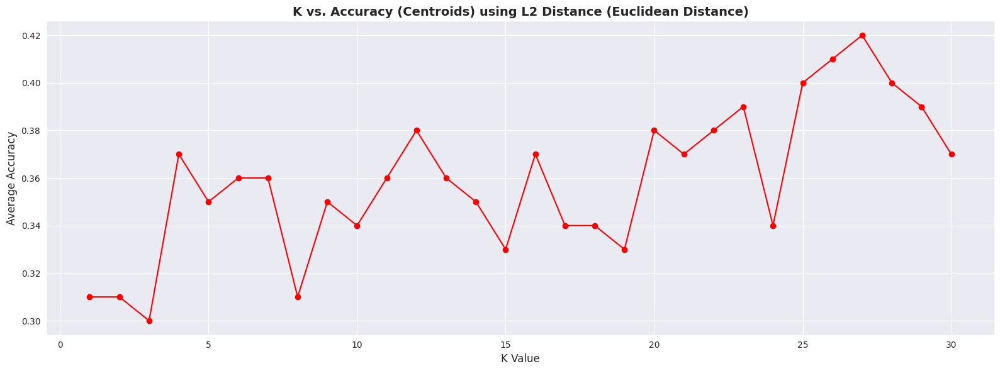

In [10]:

average_accuracies = {k: np.mean(acc) for k, acc in euclidean_accuracies.items()}

plt.figure(figsize=(16, 6))

plt.plot(
    list(average_accuracies.keys()),
    list(average_accuracies.values()),
    marker='o',
    linestyle='-',
    color='red',
    markersize=6,
    markerfacecolor='red'
)


plt.xlabel('K Value', fontsize=12)
plt.ylabel('Average Accuracy', fontsize=12)
plt.title('K vs. Accuracy (Centroids) using L2 Distance (Euclidean Distance)', fontsize=14, fontweight='bold')

plt.grid(True)


plt.tight_layout()
plt.show()


**Discussion**:

In this study, we evaluated the performance of Manhattan (L1) and Euclidean (L2) distance metrics using a 5-fold cross-validation approach on a grayscale image dataset. The comparison was based on average classification accuracy across different values of k in the k-Nearest Neighbors (k-NN) algorithm.

Overall, Euclidean distance (L2) consistently outperformed Manhattan distance (L1) in terms of average accuracy across the folds. This suggests that the Euclidean metric is more effective in capturing the subtle pixel-level variations present in the 32×32 grayscale images. Since Euclidean distance emphasizes larger differences more heavily due to the squared terms, it may be better suited for datasets where spatial structure and pixel intensity gradients matter—such as images.

On the other hand, Manhattan distance treats all pixel differences equally, which can be less sensitive to significant variations in the feature space. However, it may still be useful in high-dimensional or sparse datasets where robustness to outliers is important.

The grayscale nature of the dataset introduces uniformity in pixel intensity, which likely benefits the L2 metric by making subtle texture or shape patterns more discernible. Also, since the dataset has complex class distributions (likely with overlapping features), the additional sensitivity of Euclidean distance might have helped in distinguishing between similar classes more effectively.

**Limitations and Future Improvements:**

*   The dataset could be further preprocessed using dimensionality reduction techniques like PCA to reduce noise and redundancy.
*   Exploring more advanced distance metrics such as Mahalanobis distance or learned similarity metrics could provide further improvements.

*   Incorporating data augmentation or feature extraction (e.g., with HOG, SIFT, or CNN-based embeddings) could significantly improve classification accuracy.

*   Lastly, comparing performance with non-distance-based classifiers like SVMs or neural networks would help contextualize the effectiveness of k-NN.






**Top 5 Predictions**

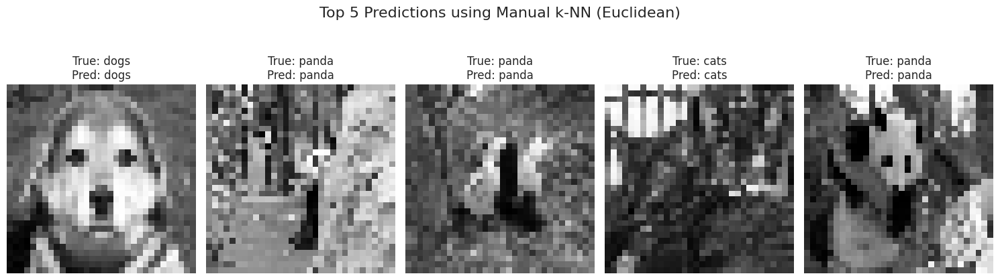

In [13]:

test_indices = random.sample(range(len(data)), 5)
test_images = data[test_indices]
test_labels = labels[test_indices]


train_indices = [i for i in range(len(data)) if i not in test_indices]
train_images = data[train_indices]
train_labels = labels[train_indices]


reverse_label_map = {v: k for k, v in label_map.items()}


plt.figure(figsize=(15, 5))
for i, (test_img, true_label) in enumerate(zip(test_images, test_labels)):

    predicted_label = knn_predict(train_images, train_labels, test_img, k=5, distance='l2')


    reshaped_img = test_img.reshape(32, 32)

    plt.subplot(1, 5, i + 1)
    plt.imshow(reshaped_img, cmap='gray')
    plt.title(f"True: {reverse_label_map[true_label]}\nPred: {reverse_label_map[predicted_label]}")
    plt.axis('off')

plt.suptitle("Top 5 Predictions using Manual k-NN (Euclidean)", fontsize=16)
plt.tight_layout()
plt.show()
